In [72]:
suppressWarnings(suppressPackageStartupMessages({
    library(Seurat)
    library(Signac)
    library(EnsDb.Hsapiens.v86)
    library(dplyr)
    library(ggplot2)
    library(bedr)
    library(SeuratDisk)
    library(scales)
    library(reshape2)
    library(Hmisc)
    library(tidyr)
    library(tidyverse)
    library(crayon)
    library(readr)
    library(future)
    library(combinat)
    library("TxDb.Hsapiens.UCSC.hg38.knownGene")
    library(GenomicRanges)
    library(GenomicFeatures)
    library(rsnps)
    library(biomaRt)
    library(ggpubr)
    library(gridExtra)
    library(patchwork)
    library(EnhancedVolcano)
    library(rlist)
    library(purrr)
}))
options(timeout=1000)
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')

# Definitions etc

In [2]:
set.seed(1234)
options(digits=2)
stats <- c()

In [3]:
options(future.globals.maxSize= 250 * 1024^3) # 650Gb
# plan()

# Enable parallelization
plan(sequential)
plan("multicore", workers = 64)

In [4]:
if(!exists("papermill_run")) {
    prj_name = "Screen1_66guides"
    data_subdir_suffixes = "L1,L2,L3,L4"     
    secondary_a_path = "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/"
    save_seurat_h5 = "YES"
}

In [5]:
custom_theme <- theme(
  plot.title = element_text(size=16, hjust = 0.5), 
  legend.key.size = unit(0.7, "cm"), 
  legend.text = element_text(size = 14))

### Load guide df

In [6]:
df_guide = read.table("/home/vsevim/prj/1012-ckd/S1/scripts/library_csv/66CRISPRi_ref_for_diffex.txt", sep = "\t", header = T, strip.white = T)
head(df_guide)

,gene,guide1,guide2,alias,subclass,class,gene_or_rsid,label
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CD13,CD13-1a,CD13-1b,ANPEP,tss,targeting,ANPEP,Control TSS
2,CD55,CD55-1a,CD55-1b,CD55,tss,targeting,CD55,Control TSS
3,CD73,CD73-1a,CD73-1b,NT5E,tss,targeting,NT5E,Control TSS
4,FUBP1,FUBP1-1a,FUBP1-1b,FUBP1,tss,targeting,FUBP1,Control TSS
5,C15orf40,C15orf40-1a,C15orf40-1b,C15orf40,tss,targeting,C15orf40,Control TSS
6,MAFF,MAFF-1a,MAFF-1b,MAFF,tss,targeting,MAFF,Control TSS


### Load Seurat file

In [7]:
integrated_h5_path <- "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/integrated/seurat_objects/integrated.h5seurat"
seurat_combined    <- LoadH5Seurat(integrated_h5_path, verbose = F)
#seurat_combined    <- subset(seurat_combined, subset=status=='singlet')

Validating h5Seurat file

Warning message:
"Adding a command log without an assay associated with it"


Normalize RNA counts by <font color='red'>NormalizeData</font>  before running FindMarkers

In [8]:
seurat_rna = CreateSeuratObject(seurat_combined[['RNA']])
seurat_rna <- NormalizeData(seurat_rna)
seurat_rna@meta.data <- seurat_combined@meta.data

### Load THRESHOLDS.tsv

In [9]:
thr_f_name = paste0(secondary_a_path, "/integrated/THRESHOLDS.tsv")
df_thresholds = read.table(thr_f_name, header=T, strip.white = T)
df_thresholds <- df_thresholds %>% pivot_wider(names_from = batch, values_from = threshold)
df_thresholds <- as.data.frame(df_thresholds)

## FeaturePlot singlet & doublet

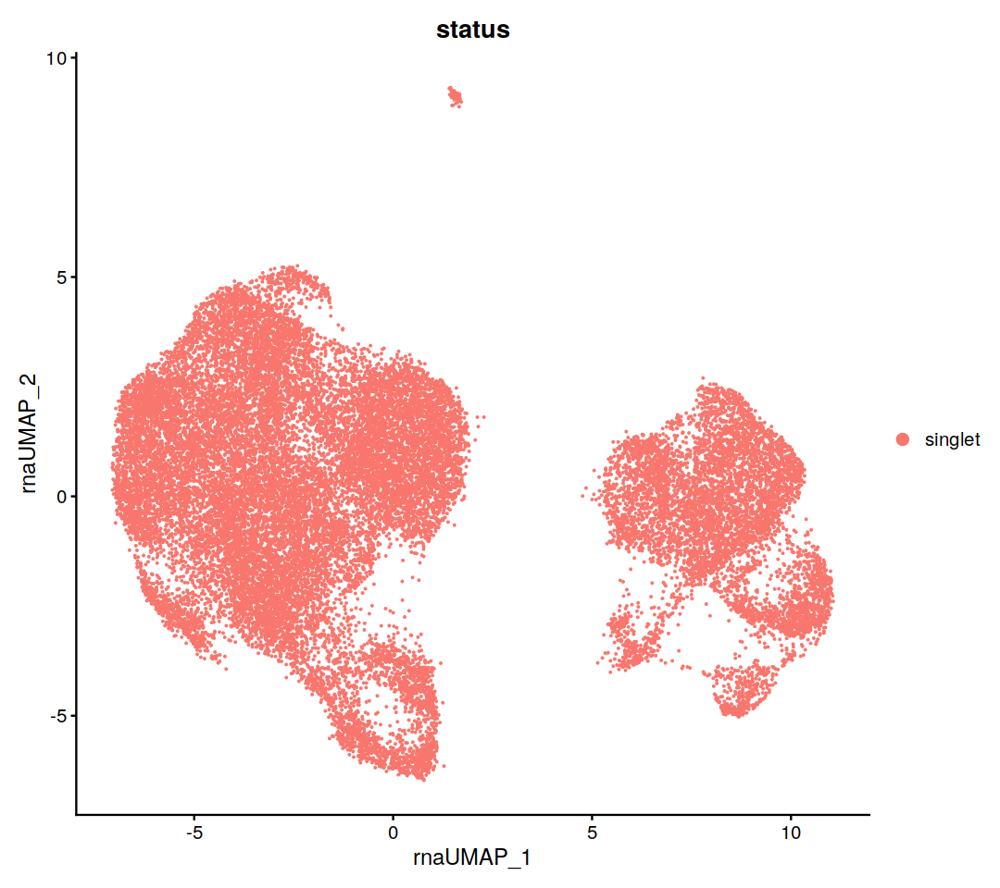

In [10]:
options(repr.plot.width=9, repr.plot.height=8)
DimPlot(seurat_combined, group.by='status')

# Differential expression

## Select perturbed/control cells
Find guide+ (perturbed) and guide- (unperturbed) cells for each guide

In [11]:
libraries = unique(seurat_combined$library)
seurat_libs = list()
for(i in seq_along(libraries)){ 
    lib = libraries[i]
    seurat_libs[[i]] = subset(seurat_combined, subset = library == lib)
}
names(seurat_libs) <- libraries

In [12]:
perturbed_cells_by_guide = list()

for(i in 1:nrow(df_thresholds)){  
    perturbed_cells_in_all_libs = list()
    guide = df_thresholds$guide[i]
    # Loop over libraries
    for(lib in libraries){        
        seurat_lib = seurat_libs[[lib]]
        threshold = df_thresholds[i, lib]        
        #cat(blue(guide, lib, threshold, "\n"))
        cells_in_lib = Cells(seurat_lib)        
        sgrna_counts = seurat_lib[['sgRNA']]@counts
        select_perturbed = sgrna_counts[guide, cells_in_lib] >= threshold
        perturbed_cells_in_library = cells_in_lib[select_perturbed]
        #cat(length(cells_in_lib), "in", lib, guide, length(perturbed_cells_in_library), "cells >", threshold, "\n")        
        if(!is.na(threshold)) {
            perturbed_cells_in_all_libs = append(perturbed_cells_in_all_libs, perturbed_cells_in_library)
        }
    }
    perturbed_cells_by_guide[[i]] = perturbed_cells_in_all_libs
}
names(perturbed_cells_by_guide) <- df_thresholds$guide

In [13]:
length(perturbed_cells_by_guide[[3]])

[1] 796

In [14]:
df_thresholds$guide[grepl("NT" , df_thresholds$guide)]

[1] "NTCE1-1a" "NTCE1-1b" "NTCE2-1a" "NTCE2-1b" "NTCE3-1a" "NTCE3-1b" "NTCE4-1a"
[8] "NTCE4-1b"

## Helper functions (Just source helper_functions_for_diffex.r instead)

Mark cells that are positive for given guides as guide_positive, all others as guide_negative

In [15]:
mark_guide_pos_neg <- function(seurat_obj, perturbed_cells_by_guide, guides, print_counts = T) {
    all_cells = Cells(seurat_obj)
    perturbed_cells = c()
    dummy_perturbed = c()
    
    for(guide in guides) {
        dummy_perturbed = unlist(perturbed_cells_by_guide[[guide]])
        perturbed_cells = union(perturbed_cells, dummy_perturbed)
        #cat(guide," ", length(perturbed_cells), "\n")
    }

    unperturbed_cells = unlist(setdiff(all_cells, perturbed_cells))
    Idents(seurat_obj) <- "guide_negative"
    seurat_obj <- SetIdent(seurat_obj, cells = perturbed_cells, value = "guide_positive") 

    if(print_counts) {
        n_gplus   = length(perturbed_cells)
        n_gminus = length(unperturbed_cells)    
        cat(blue("Guide+ =",n_gplus, "; Guide- =", n_gminus, "\n"))
    }
    
    seurat_obj
}

Mark cells that are positive for given guides as 'guide_positive', unperturbed as 'unperturbed', all others as 'guide_negative'. The 'unperturbed' are the cells with either no guides at all or only positive for non-targeting guides. I wanted use them as a gold-standard set of controls, but their number is pretty low. 

In [16]:
mark_pert_unpert <- function(seurat_obj, perturbed_cells_by_guide, df_guides, guides, print_counts = F) {
    guide_classes = unique(filter(df_guide, guide1 %in% guides | guide2 %in% guides)$class)
    if('nt_ctrl' %in% guide_classes) {
        stop("You can't pass non-targeting guides to mark_pert_unpert()")
    }
    select_targeting_guides = df_guides$class == 'targeting'
    df_targeting  = df_guides[select_targeting_guides, ]
    targeting_guides = c(df_targeting$guide1, df_targeting$guide2)
    seurat_dummy <- mark_guide_pos_neg(seurat_obj, perturbed_cells_by_guide, targeting_guides, print_counts = F)
    unperturbed_cells <- Cells(subset(seurat_dummy, idents='guide_negative'))
    
    seurat_dummy <- mark_guide_pos_neg(seurat_obj, perturbed_cells_by_guide, guides, print_counts = F)
    seurat_dummy <- SetIdent(seurat_dummy, cells = unperturbed_cells, value = "unperturbed")
    if(print_counts) {
        n_unpert = length(Cells(subset(seurat_dummy, idents='unperturbed')))
        n_pert = length(Cells(subset(seurat_dummy, idents='guide_positive')))
        cat(blue("Guide+ =",n_pert, "; Unperturbed =", n_unpert, "\n"))
    }
    seurat_dummy
}

Mark two different set of guides, A and B

In [17]:
mark_a_b <- function(seurat_obj, arg_perturbed_cells_by_guide, guides_a, guides_b) {
    all_cells = Cells(seurat_obj)
    a_cells = c()
    b_cells = c()
    dummy = c()
    
    Idents(seurat_obj) <- ""
    for(guide in guides_a) {
        dummy = unlist(arg_perturbed_cells_by_guide[[guide]])
        a_cells = union(a_cells, dummy)
    }

    dummy = c() 
    for(guide in guides_b) {
        dummy = unlist(arg_perturbed_cells_by_guide[[guide]])
        b_cells = union(b_cells, dummy)
    }

    # Discard overlapping cells
    overlapping_cells = intersect(a_cells, b_cells)
    a_cells = setdiff(a_cells, overlapping_cells)
    b_cells = setdiff(b_cells, overlapping_cells)
    
    n_a = length(a_cells)
    n_b = length(b_cells)
    cat(blue("A =", n_a, "; B =", n_b, "\n"))
    
    seurat_obj <- SetIdent(seurat_obj, cells = a_cells, value = "A") 
    seurat_obj <- SetIdent(seurat_obj, cells = b_cells, value = "B") 
    seurat_obj
}

Find guides that belong to a class/subclass

In [18]:
get_guides_by_subclass <- function(df_guides, column, value) {
    # column variable can be either 'class' or 'subclass'
    select_subclass = df_guides[, column] == value
    df_subclass     = df_guides[select_subclass, ]
    subclass_guides = c(df_subclass$guide1, df_subclass$guide2)
    subclass_guides    
}

Produce Vlnplot for given targets

In [19]:
# vlnplot_for_targets <- function(seurat_obj, df_guide, perturbed_cells_by_guide, targets) {
#     plt_list = list()
#     for(i in seq_along(targets)) {
#         target = targets[i]
#         print(target)
#         guides = get_guides_by_subclass(df_guide, 'alias', target)
#         seurat_rna <- mark_guide_pos_neg(
#             seurat_obj, 
#             perturbed_cells_by_guide, 
#             guides, 
#             print_counts = T
#         )

#         options(repr.plot.width=5, repr.plot.height=4)
#         plt <- VlnPlot(
#             object = seurat_rna,
#             features =  target, 
#             idents = NULL, 
#             pt.size = 0., 
#             sort = F, 
#             ncol = 1,    
#         ) + theme(legend.position = 'none')
#         plt_list[[i]] = plt
#     }
#     plt_list
# }

Produce RidgePlot for given targets

In [20]:
ridgeplot_for_targets <- function(seurat_obj, df_guide, perturbed_cells_by_guide, targets) {
    plt_list = list()
    for(i in seq_along(targets)) {
        target = targets[i]
        print(target)
        guides = get_guides_by_subclass(df_guide, 'alias', target)
        seurat_rna <- mark_guide_pos_neg(
            seurat_obj, 
            perturbed_cells_by_guide, 
            guides, 
            print_counts = T
        )

        options(repr.plot.width=20, repr.plot.height=4)
        plt <- RidgePlot(
            object = seurat_rna,
            features =  targets, 
            idents = NULL,             
            sort = F, 
            ncol = length(targets),    
        ) + + theme(legend.position = 'none')
        plt_list[[i]] = plt
    }
    plt_list
}

### Applications

Find all unperturbed cells: these are the cells with either no guides or only NT guides

In [21]:
select_targeting_guides = df_guide$class == 'targeting'
df_targeting  = df_guide[select_targeting_guides, ]
targeting_guides = c(df_targeting$guide1, df_targeting$guide2)
seurat_rna <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, targeting_guides)
unperturbed_cells <- Cells(subset(seurat_rna, idents='guide_negative'))

Guide+ = 19498 ; Guide- = 7643 


# Compare NTCE to GDOC to CCCE

In [22]:
guides_ntce = get_guides_by_subclass(df_guide, 'subclass', 'ntce')
guides_gdoc = get_guides_by_subclass(df_guide, 'subclass', 'gdoc')
guides_ccce = get_guides_by_subclass(df_guide, 'subclass', 'ccce')

### NTCE vs GDOC

In [23]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_ntce, guides_gdoc)
test_use = "LR"

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = test_use,
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 3487 ; B = 2430 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### NTCE vs CCCE

In [24]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_ntce, guides_ccce)

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 3495 ; B = 2458 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### GDOC vs CCCE

In [25]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_gdoc, guides_ccce)
test_use = "LR"

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = test_use,
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 2662 ; B = 2682 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### Result

No <font color='yellow'> differentially expressed genes </font> between three classes of controls

# Is it better to compare guide+ vs guide- OR guide+ vs unperturbed?

Normalize RNA counts by <font color='red'>NormalizeData</font>  before running FindMarkers

In [26]:
seurat_rna = CreateSeuratObject(seurat_combined[['RNA']])
seurat_rna <- NormalizeData(seurat_rna)
seurat_rna@meta.data <- seurat_combined@meta.data

Guide+ = 2060 ; Unperturbed = 7643 


Picking joint bandwidth of 0.0555



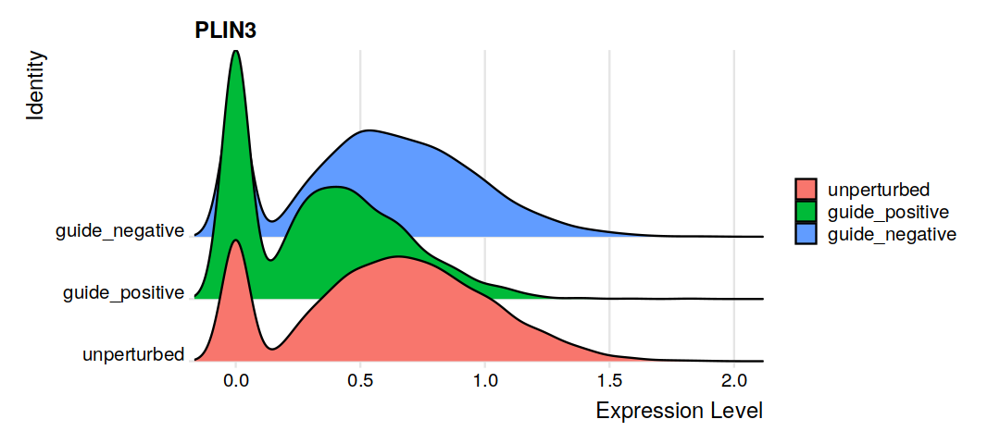


 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ZIM3,0.0e+00,0.98,0.89,0.436,0.0e+00
LINC01705,7.0e-246,0.72,0.91,0.570,2.5e-241
SQSTM1,7.3e-215,0.73,0.99,0.983,2.7e-210
PLIN3,3.7e-208,-0.43,0.65,0.829,1.4e-203
LINC01655,6.1e-169,0.43,0.73,0.386,2.2e-164
AL138828.1,1.1e-166,0.81,0.51,0.227,3.9e-162
GAS5,1.3e-166,0.57,0.99,0.984,4.8e-162
LINC02257,2.4e-166,0.43,0.74,0.400,8.9e-162
OLAH,3.3e-157,0.31,0.27,0.054,1.2e-152


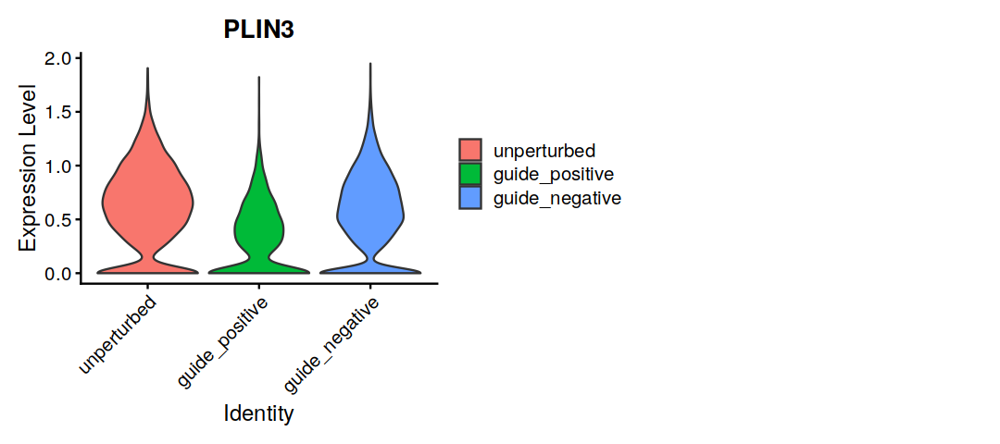

In [27]:
guides = c('PLIN3-1a', 'PLIN3-1b', 'PLIN3-2a', 'PLIN3-2b')
#seurat_rna <- mark_guide_pos_neg(seurat_rna, guides)
seurat_rna <- mark_pert_unpert(seurat_rna, perturbed_cells_by_guide, df_guide, guides, print_counts = T)


options(repr.plot.width=9, repr.plot.height=4)
RidgePlot(
    seurat_rna,    
    features = c('PLIN3'),
    sort = FALSE,
    ncol = 1
)

VlnPlot(
    object = seurat_rna,
    features =  c('PLIN3'), 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 2,    
) 


markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'guide_positive',
    ident.2 = 'unperturbed',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

In [28]:
nrow(markers)

[1] 187

Guide+ = 2060 ; Guide- = 25081 


Picking joint bandwidth of 0.0527



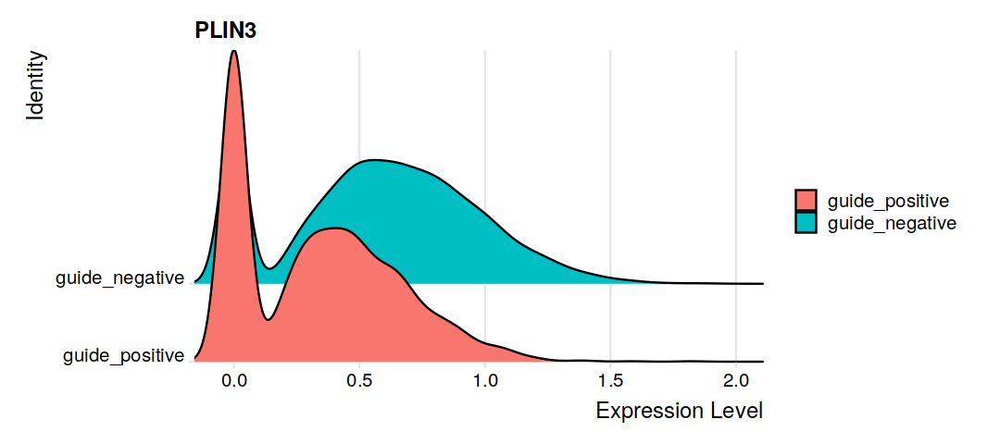


 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  34% with 0 failures

 Completed [================>---------------------------]  38% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [======================>----

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PLIN3,2.2e-188,-0.38,0.65,0.81,7.9e-184
ZIM3,1.6e-84,0.34,0.89,0.72,5.8e-80
SQSTM1,7.1e-72,0.39,0.99,0.99,2.6e-67
FABP5,2.9e-68,-0.31,0.58,0.73,1.1e-63
PSAP,2.5e-54,0.29,0.99,0.98,9.0e-50
AL138828.1,3.3e-47,0.42,0.51,0.36,1.2e-42
PTMA,6.8e-46,-0.25,0.99,1.00,2.5e-41
AL357507.1,3.1e-41,0.38,0.28,0.15,1.1e-36
HMOX1,1.2e-33,0.42,0.73,0.65,4.5e-29


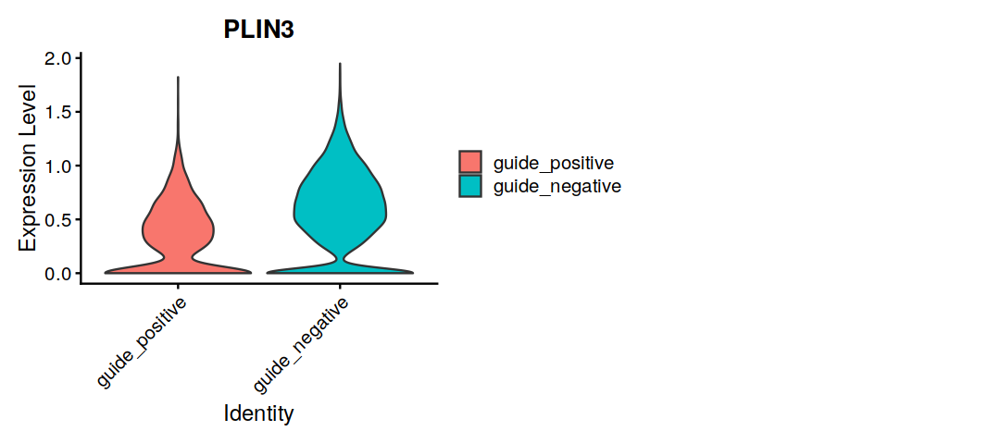

In [29]:
guides = c('PLIN3-1a', 'PLIN3-1b', 'PLIN3-2a', 'PLIN3-2b')
#seurat_rna <- mark_guide_pos_neg(seurat_rna, guides)
seurat_rna <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides, print_counts = T)


options(repr.plot.width=9, repr.plot.height=4)
RidgePlot(
    seurat_rna,    
    features = c('PLIN3'),
    sort = FALSE,
    ncol = 1
)

VlnPlot(
    object = seurat_rna,
    features =  c('PLIN3'), 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 2,    
) 

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'guide_positive',
    ident.2 = 'guide_negative',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

### How many no-guide cells?

In [30]:
all_cells_w_a_guide = unique(unlist(perturbed_cells_by_guide))
all_cells = unique(Cells(seurat_rna))
no_guide_cells = setdiff(all_cells, all_cells_w_a_guide)

In [31]:
length(no_guide_cells)

[1] 6380

### How many 'non-targeting only' cells?

# * * * Genomewide DE for all Targeting Guides * * *

In [32]:
count_idents <- function(seurat_obj, idents) {
    length(Cells(subset(seurat_obj, idents = idents)))
}

In [96]:
targets = unique(filter(df_guide, class=='targeting')$alias)
#targets = unique(df_guide$alias)
df_de = NULL
genes_to_skip = c("DE5", "CD55", "CSTB")
genes_to_skip = c()
lfc_threshold = 0.10
test_use = "LR"

for(target in targets){
    if(target %in% genes_to_skip){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = "LR",
        latent.vars = c("library", "donor"),
        logfc.threshold = lfc_threshold,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(Red("No DE genes", target,  "\n"))
    }
    markers$de_gene = rownames(markers)
    markers$target = target
    rownames(markers) <- NULL
    df_de = rbind(df_de, markers)
}

Write to file

In [34]:
lfc = gsub("\\.", "_", lfc_threshold)
de_f_name = paste0(secondary_a_path, "/integrated/DE_outputs/DE_genes_by_target_LFC_", lfc, "_UNFILTERED.tsv")
write.table(df_de, de_f_name, sep="\t", quote = F, row.names = F)

### Filter out spurious hits

In [35]:
# Some genes come up as differentially expressed all the time
# Filter those out, and write to another file
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
df_de = filter(df_de, !(de_gene  %in% funky_de_genes))

de_f_name = paste0(secondary_a_path, "/integrated/DE_outputs/DE_genes_by_target_LFC_", lfc, "_FILTERED.tsv")
write.table(df_de, de_f_name, sep="\t", quote = F, row.names = F)

# Inpect DE results

In [36]:
df_de = read.table(de_f_name, sep="\t",  header = T)

Print top high-confidence hits

In [37]:
df_de %>% filter(avg_log2FC < 0) %>% arrange(p_val_adj) %>% head(30)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,0.0e+00,-0.55,1.000,1.00,0.0e+00,FTH1,FTH1
2,1.6e-271,-0.93,0.800,0.92,5.9e-267,LGALS3,LGALS3
3,5.6e-264,-0.72,0.336,0.80,2.1e-259,NT5E,NT5E
4,3.6e-222,-0.54,0.941,0.98,1.3e-217,TKT,TKT
5,1.1e-194,-0.37,0.172,0.60,4.0e-190,C15orf40,C15orf40
6,1.9e-188,-0.38,0.649,0.81,7.0e-184,PLIN3,PLIN3
7,2.2e-159,-0.69,0.944,0.96,8.2e-155,CTSB,CTSB
8,4.7e-155,-0.63,0.461,0.78,1.7e-150,ANPEP,ANPEP
9,3.2e-128,-0.31,0.953,0.98,1.2e-123,CSTB,CSTB


In [38]:
targets = unique(df_de$target)

for(t in targets){
    print(filter(df_de, target == t) %>% head(1))
    #cat(yellow("------------------------------------------------------------\n\n\n"))

}

     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 4.7e-155      -0.63  0.46  0.78  1.7e-150   ANPEP  ANPEP
   p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 9e-100      -0.21 0.088  0.37   3.3e-95    CD55   CD55
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 5.6e-264      -0.72  0.34   0.8  2.1e-259    NT5E   NT5E
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 8.9e-53      -0.25  0.47  0.68   3.3e-48   FUBP1  FUBP1
     p_val avg_log2FC pct.1 pct.2 p_val_adj  de_gene   target
1 1.1e-194      -0.37  0.17   0.6    4e-190 C15orf40 C15orf40
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 3.7e-52       0.46  0.92  0.72   1.4e-47    ZIM3   MAFF
  p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1     0      -0.55     1     1         0    FTH1   FTH1
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1.9e-188      -0.38  0.65  0.81    7e-184   PLIN3  PLIN3
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 3.6

# Inspect DE between clusters

## Are HMOX1, SQSTM1 etc localized to a cluster? No

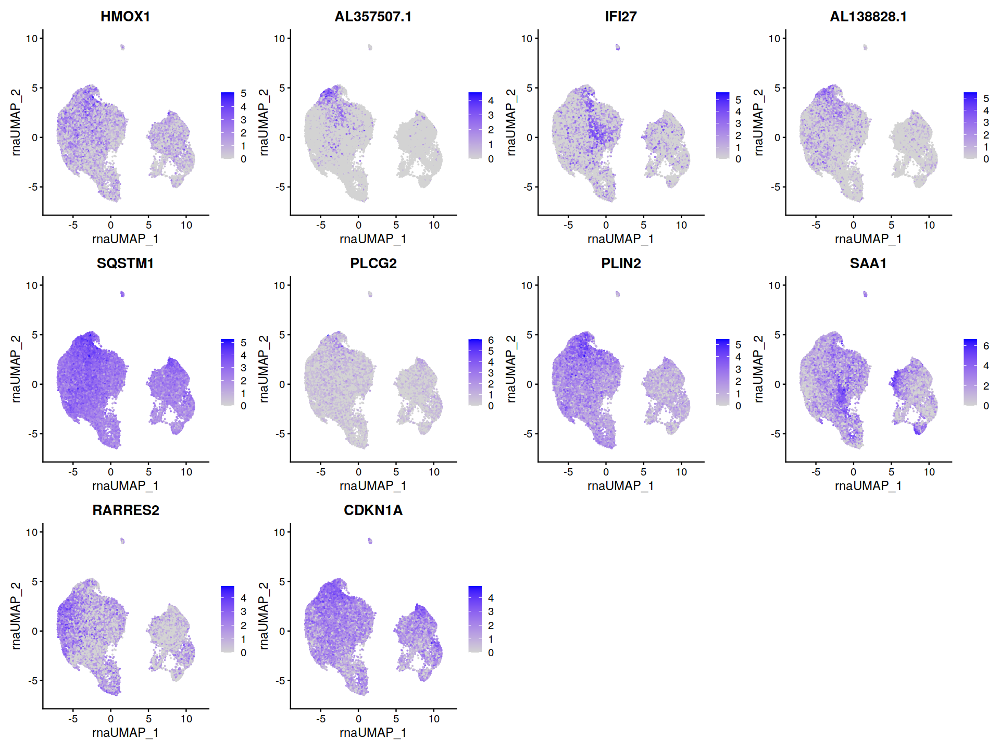

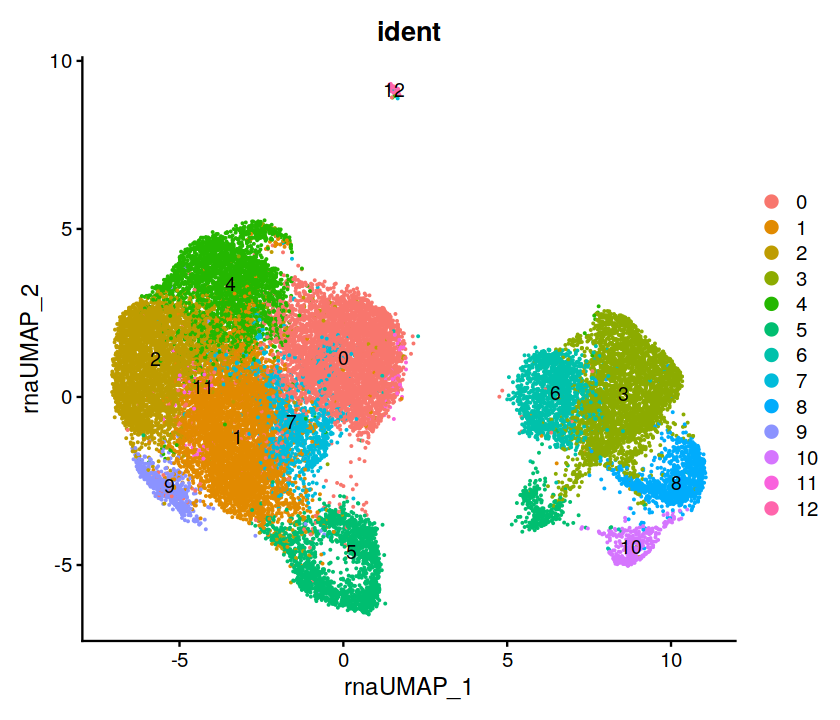

In [39]:
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
options(repr.plot.width = 16, repr.plot.height = 12)
FeaturePlot(seurat_combined, features = funky_de_genes, ncol=4)
options(repr.plot.width=7, repr.plot.height=6)    
DimPlot(seurat_combined, label=T, group.by='ident')

# Compare Cluster 1 to 4

In [40]:
seurat_dummy = NormalizeData(seurat_combined)

In [41]:
Idents(seurat_dummy) <- seurat_dummy$seurat_clusters

markers <- FindMarkers(
        object = seurat_combined,
        assay = 'RNA',
        slot = "data",
        ident.1 = 1,
        ident.2 = 4,
        test.use = "MAST",
        logfc.threshold = 2,
        latent.vars = c('library', 'donor'),
        verbose = F
    )


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

# Plot upregulated

In [42]:
cluster_de_genes <- rownames(filter(markers, (p_val_adj < 1e-80) & (avg_log2FC > 2))) %>% head(50)
cat(cluster_de_genes, "\n")

AC011313.1 AC113386.1 ACTB ACTG1 ACTN4 ADAMTS1 AHNAK AK5 ANXA2 ANXA4 ARHGAP29 ARL4C ASRGL1 ATP5MG BTF3 C12orf75 CDH6 CGNL1 CLIC1 CTNNAL1 DBI DCDC2 EEF1A1 FXYD2 GDA H3F3A HNRNPA1 HOOK1 IL18 JPT1 KCNJ15 LAMB1 LAPTM4A LAPTM4B LDHB LIMCH1 MARCKSL1 MYL6 MYOF NDUFS5 NLGN1 NME2 NPM1 PARK7 PAX8 PLAU PRUNE2 PRXL2A RPL24 RPL7 


In [43]:
markers %>% arrange(p_val_adj) %>% filter(avg_log2FC > 5) %>% head(50) %>% rownames()

[1] "AC011313.1" "AC113386.1" "ACTB"       "ACTG1"      "ACTN4"     
 [6] "ADAMTS1"    "AHNAK"      "AK5"        "ANXA2"      "ANXA4"     
[11] "ARHGAP29"   "ARL4C"      "ASRGL1"     "ATP5MG"     "BTF3"      
[16] "C12orf75"   "CDH6"       "CGNL1"      "CLIC1"      "CTNNAL1"   
[21] "DBI"        "DCDC2"      "EEF1A1"     "FXYD2"      "GDA"       
[26] "H3F3A"      "HNRNPA1"    "HOOK1"      "IL18"       "JPT1"      
[31] "LAMB1"      "LAPTM4A"    "LAPTM4B"    "LDHB"       "LIMCH1"    
[36] "MARCKSL1"   "MYL6"       "MYOF"       "NDUFS5"     "NLGN1"     
[41] "NME2"       "NPM1"       "PARK7"      "PAX8"       "PLAU"      
[46] "PRUNE2"     "PRXL2A"     "RPL24"      "RPL7"       "RPL7A"

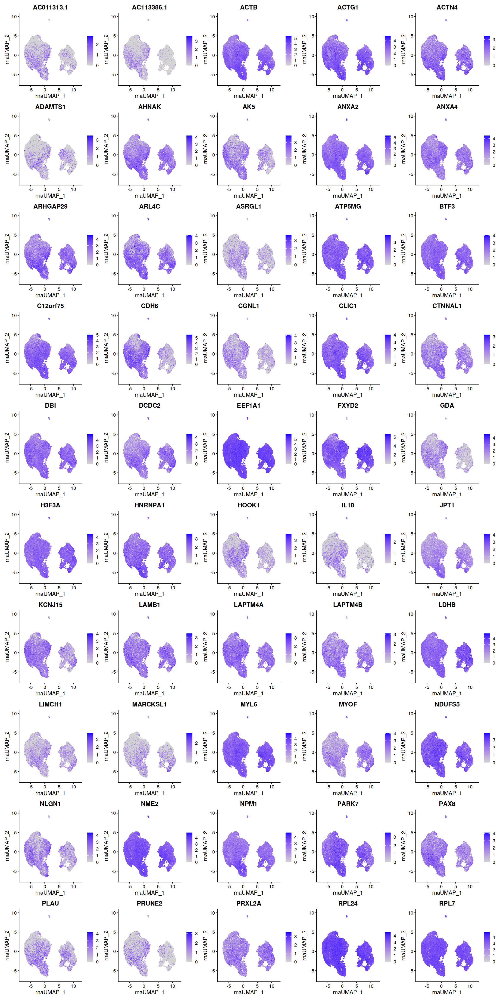

In [44]:
options(repr.plot.width=18, repr.plot.height=36)
FeaturePlot(seurat_combined, features = cluster_de_genes, ncol=5)

In [45]:
sample_n(markers, 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RPL19,4.9e-77,80.2,1.00,0.998,1.8e-72
RIMS2,1.0e-05,-6.3,0.44,0.509,3.8e-01
STK10,7.6e-42,-96.2,0.44,0.290,2.8e-37
VDAC1,2.4e-223,29.6,0.99,0.949,8.8e-219
CTBP2,1.3e-10,2.4,0.91,0.876,4.9e-06
MAGI2,9.3e-02,-66.9,0.85,0.868,1.0e+00
CYLD,3.8e-19,-3.9,0.36,0.454,1.4e-14
PPP1R3B,1.7e-10,6.7,0.47,0.399,6.1e-06
SERPINB3,6.2e-158,3.7,0.31,0.065,2.3e-153


# Plot downregulated

DCBLD2 DDIT3 HSP90B1 ITPKA OLAH COBLL1 ZIM3 CALR MSC-AS1 SNHG5 RPL5 PNRC1 CEBPB PDIA4 BTG1 LINC00973 TKT RPL3 CAP1 CCPG1 SNRPE MPC2 MAP2 APLP2 TCEA1 COL4A2 H1F0 ZNF385D RPS15 DDIT4 GBE1 CTSC PLIN2 ARHGEF28 GNPTAB HSPE1 SSBP1 TRNP1 EPB41L4A-AS1 PLIN3 TENT5A TRIB3 SH3BGRL3 SESN2 ITGA6 RRAD ARRDC4 AL138828.1 KLF9 SRSF3 


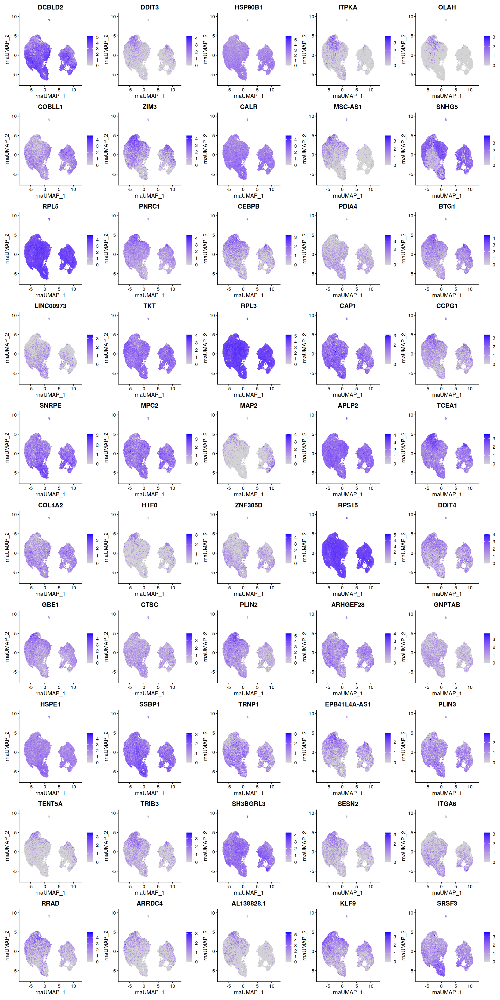

In [46]:
cluster_de_genes <- rownames(filter(markers, (p_val_adj < 1e-40) & (avg_log2FC < -4))) %>% head(50)
cat(cluster_de_genes, "\n")
options(repr.plot.width=18, repr.plot.height=36)
FeaturePlot(seurat_combined, features = cluster_de_genes, ncol=5)

## Plot all controls

In [47]:
all_controls = unique(filter(df_guide, subclass == "tss" | subclass == 'de_control')$alias)

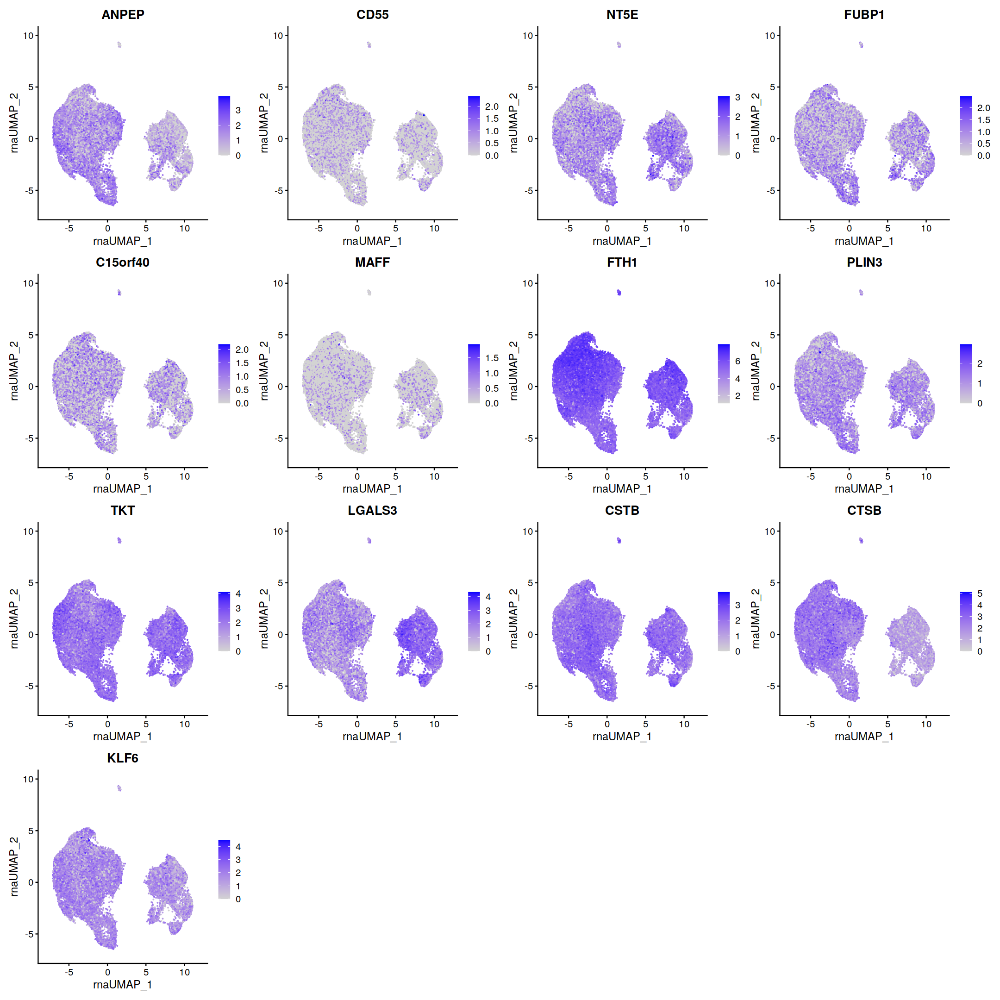

In [48]:
options(repr.plot.width=18, repr.plot.height=18)
FeaturePlot(seurat_combined, features = all_controls, ncol=4)

# Visualize Knockdowns

## Spurious hits

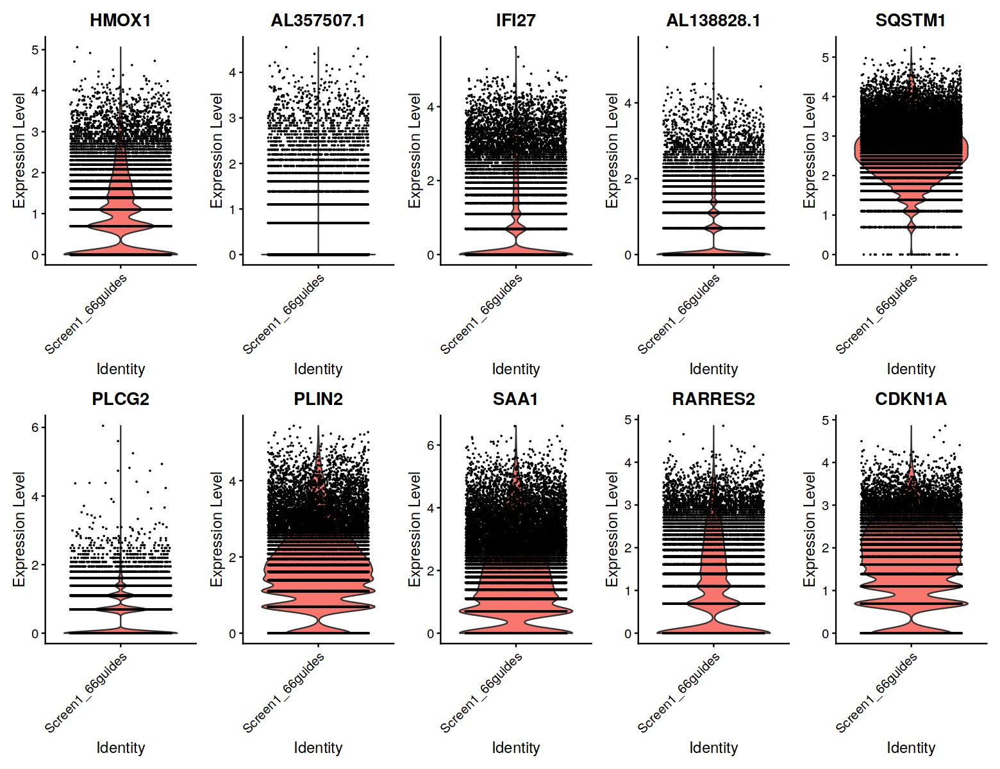

In [49]:
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
options(repr.plot.width = 13, repr.plot.height = 10)
VlnPlot(seurat_combined, features = funky_de_genes, group.by = 'orig.ident', pt.size = 0.001, ncol=5)

## TSS controls

[1] "ANPEP"
CD13-1a   868 
CD13-1b   1162 
Guide+ = 1162 ; Guide- = 25979 
[1] "CD55"
CD55-1a   796 
CD55-1b   1081 
Guide+ = 1081 ; Guide- = 26060 
[1] "NT5E"
CD73-1a   758 
CD73-1b   1021 
Guide+ = 1021 ; Guide- = 26120 
[1] "FUBP1"
FUBP1-1a   710 
FUBP1-1b   926 
Guide+ = 926 ; Guide- = 26215 
[1] "C15orf40"
C15orf40-1a   823 
C15orf40-1b   1077 
Guide+ = 1077 ; Guide- = 26064 
[1] "MAFF"
MAFF-1a   665 
MAFF-1b   871 
Guide+ = 871 ; Guide- = 26270 


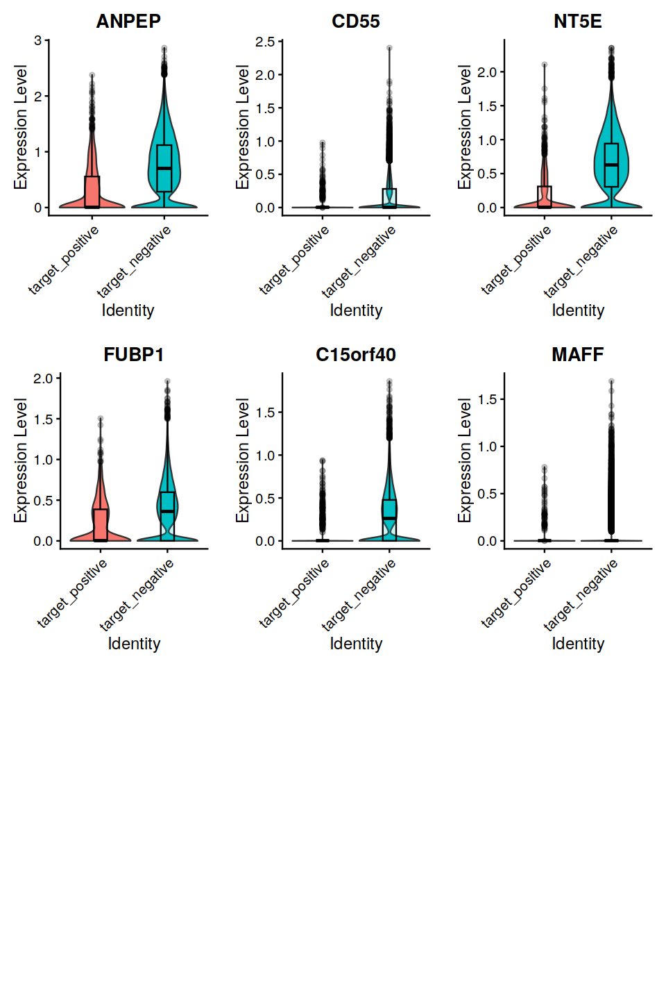

In [73]:
targets = unique(filter(df_guide, subclass=='tss')$alias)
plots = vlnplot_for_targets(seurat_rna, df_guide, perturbed_cells_by_guide, targets)
options(repr.plot.width=8, repr.plot.height=12)
ggarrange(plotlist=plots, ncol=3, nrow = 3)

## DE controls

[1] "FTH1"
FTH1-1a   624 
FTH1-2a   3330 
FTH1-1b   3503 
FTH1-2b   3503 
Guide+ = 3503 ; Guide- = 23638 
[1] "PLIN3"
PLIN3-1a   866 
PLIN3-2a   1585 
PLIN3-1b   1820 
PLIN3-2b   2060 
Guide+ = 2060 ; Guide- = 25081 
[1] "TKT"
TKT-1a   674 
TKT-2a   1497 
TKT-1b   1708 
TKT-2b   1978 
Guide+ = 1978 ; Guide- = 25163 
[1] "LGALS3"
LGALS3-1a   917 
LGALS3-2a   1660 
LGALS3-1b   1894 
LGALS3-2b   2120 
Guide+ = 2120 ; Guide- = 25021 
[1] "CSTB"
CSTB-1a   967 
CSTB-2a   1830 
CSTB-1b   2083 
CSTB-2b   2336 
Guide+ = 2336 ; Guide- = 24805 
[1] "CTSB"
CTSB-1a   999 
CTSB-2a   1794 
CTSB-1b   2029 
CTSB-2b   2221 
Guide+ = 2221 ; Guide- = 24920 
[1] "KLF6"
KLF6-1a   880 
KLF6-2a   1729 
KLF6-1b   1983 
KLF6-2b   2194 
Guide+ = 2194 ; Guide- = 24947 


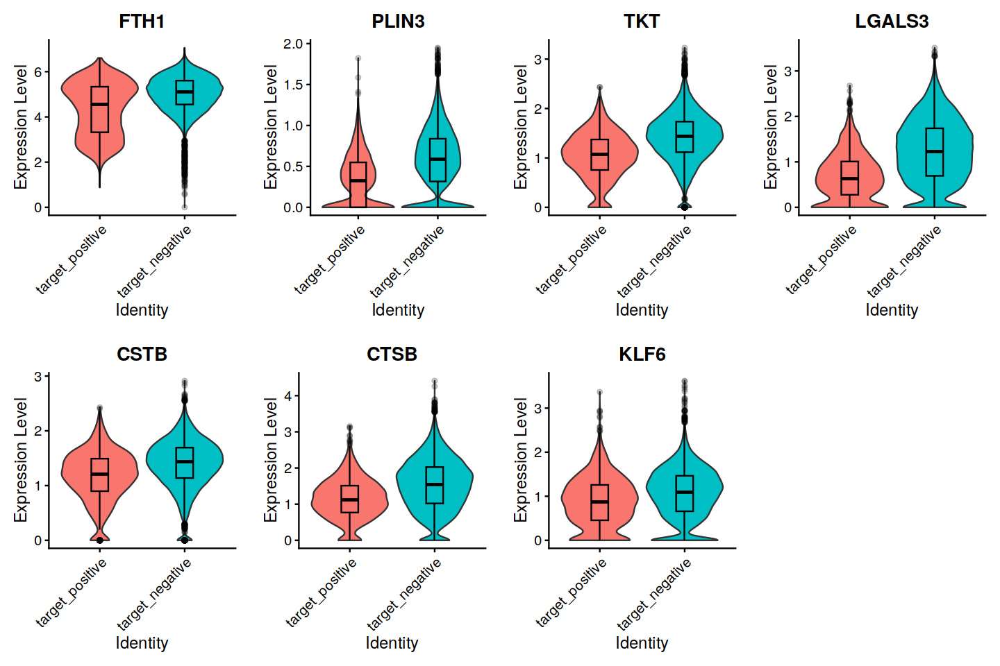

In [74]:
targets = unique(filter(df_guide, subclass=='de_control')$alias)
plots = vlnplot_for_targets(seurat_rna, df_guide, perturbed_cells_by_guide, targets)
options(repr.plot.width=12, repr.plot.height=8)
ggarrange(plotlist=plots, ncol=4, nrow = 2)

## CKD DE 

[1] "DE6"
Guide+ = 2840 ; Guide- = 24301 
[1] "DE15"
Guide+ = 2322 ; Guide- = 24819 


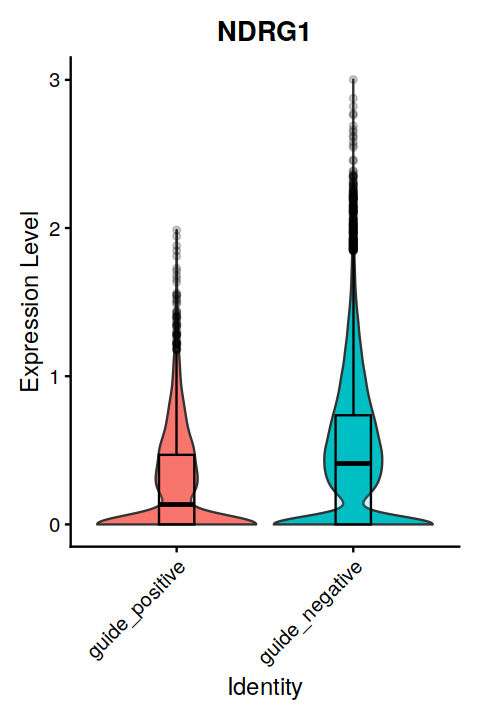

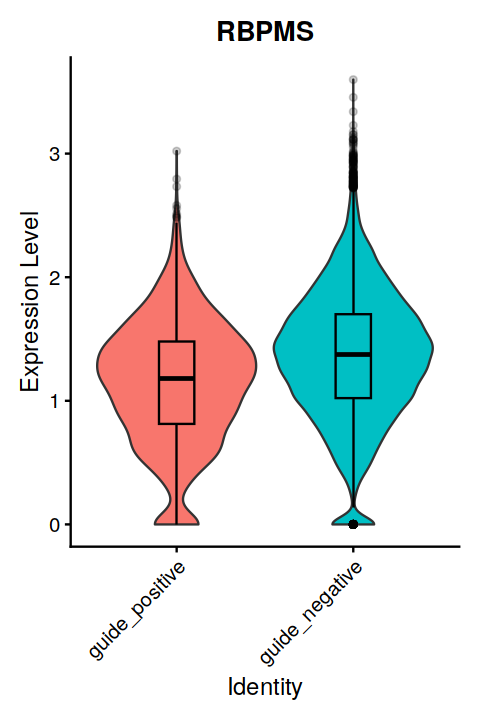

In [90]:
target = "DE6"
regulated_gene = "NDRG1"
print(target)
guides = get_guides_by_subclass(df_guide, 'alias', target)
seurat_rna <- mark_guide_pos_neg(
    seurat_rna, 
    perturbed_cells_by_guide, 
    guides, 
    print_counts = T
)

plt1 <- VlnPlot(
    object = seurat_rna,
    features = regulated_gene, 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 1,    
) +
geom_boxplot(width=0.2, color="black", alpha=0.2) + 
theme(legend.position = 'none', plot.subtitle = element_text(hjust = 0.5))     



target = "DE15"
regulated_gene = "RBPMS"
print(target)
guides = get_guides_by_subclass(df_guide, 'alias', target)
seurat_rna <- mark_guide_pos_neg(
    seurat_rna, 
    perturbed_cells_by_guide, 
    guides, 
    print_counts = T
)

plt2 <- VlnPlot(
    object = seurat_rna,
    features = regulated_gene, 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 1,    
) +
geom_boxplot(width=0.2, color="black", alpha=0.2) + 
theme(legend.position = 'none', plot.subtitle = element_text(hjust = 0.5))     

options(repr.plot.width=4, repr.plot.height=6)
print(plt1) 
print(plt2)

# Check DE for genes near SNPs

In [53]:
select_distal  = df_guide$subclass == 'ckd_de'
df_snps = unique(df_guide[select_distal, c('gene','alias')])

In [54]:
snp_coords = ncbi_snp_query(df_snps$gene)

Getting info about the following rsIDs: rs2823139, rs7642977, rs78581838, rs7707989, rs527616, rs10283362, rs34861762, rs16874072, rs881858, rs4669722, rs76839935, rs6839100, rs11154336, rs4720089, rs2979488, rs2661503, rs10224210



In [55]:
snp_upstream_range   = 1000000
snp_downstream_range = 1000000

df_snp_coords                 = data.frame(chr=paste0("chr", snp_coords$chromosome))
df_snp_coords$start_position  = snp_coords$bp #+ snp_upstream_range
df_snp_coords$end_position    = snp_coords$bp #+ snp_downstream_range
df_snp_coords$strand          = '*'
df_snp_coords$hgnc_symbol     = snp_coords$rsid
df_snp_coords$chromosome_name = snp_coords$chromosome
#snp_granges = makeGRangesFromDataFrame(df_dummy)

In [56]:
ensembl <- useEnsembl(biomart = "genes", dataset = "hsapiens_gene_ensembl")
searchDatasets(mart = ensembl, pattern = "hsapiens")
mart <- useMart("ensembl")
mart <- useDataset("hsapiens_gene_ensembl", mart)

,dataset,description,version
,<I<chr>>,<I<chr>>,<I<chr>>
79,hsapiens_gene_ensembl,Human genes (GRCh38.p13),GRCh38.p13


# Find neighbors of targets

In [57]:
genes_in_assay = rownames(seurat_rna[['RNA']]@counts)
m <- useMart('ensembl', dataset='hsapiens_gene_ensembl') # create a mart object

In [58]:
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')
control_targets = unique(filter(df_guide, subclass=='tss' | subclass == 'de_control')[,c('alias')])

df_target_coords <- getBM(mart=m, attributes=c('hgnc_symbol', 'description', 'chromosome_name',
                                 'start_position', 'end_position', 'strand',
                                 'ensembl_gene_id'),
                        filters = 'hgnc_symbol', values = control_targets)
                        
df_target_coords <- filter(df_target_coords, chromosome_name %in% c(1:23, "X","Y"))

In [59]:
gene_neighbors_list = get_neighboring_genes(bm, df_target_coords, genes_in_assay)
snp_neighbors_list  = get_neighboring_genes(bm, df_snp_coords, genes_in_assay)
neighbors_list =  append(gene_neighbors_list, snp_neighbors_list) 

ANPEP 15 88784895 90815401 
C15orf40 15 81988441 84011641 
CD55 1 206321519 208386804 
CSTB 21 42772511 44776330 
CTSB 8 10842524 12869533 
FTH1 11 60959718 62967634 
FUBP1 1 76944055 78979110 
KLF6 10 2775996 4785281 
LGALS3 14 54124110 56145423 
MAFF 22 37200767 39216507 
NT5E 6 84449584 86495791 
PLIN3 19 3838341 5867694 
TKT 3 52224712 54256052 
rs2823139 21 14204463 16204463 
rs7642977 3 193092961 195092961 
rs78581838 21 13864259 15864259 
rs7707989 5 67396052 69396052 
rs527616 18 25757460 27757460 
rs10283362 8 132320717 134320717 
rs34861762 8 22890907 24890907 
rs16874072 4 22741827 24741827 
rs881858 6 42838872 44838872 
rs4669722 2 10390110 12390110 
rs76839935 7 150870466 152870466 
rs6839100 4 75458036 77458036 
rs11154336 6 124899862 126899862 
rs4720089 7 31964026 33964026 
rs2979488 8 29423114 31423114 
rs2661503 6 50644819 52644819 
rs10224210 7 150716108 152716108 


In [60]:
list.save(neighbors_list, "/home/vsevim/prj/1012-ckd/S1/scripts/library_csv/neighbors_list.rds")

## Run diffex on genes neighboring the snps w/ min_LFC = 0.10

In [61]:
df_targets = unique(filter(df_guide, subclass=='ckd_de')[,c('alias','gene','subclass', 'label')])
df_targets = unique(filter(df_guide, class=='targeting')[,c('alias','gene','subclass', 'label')])
df_neighbor_de = NULL
test_use = "LR" #"MAST"  #"wilcox" "LR"
guides_to_skip = c()  #c("DE6", "DE15")  

for(i in 1:nrow(df_targets)) {
    target          = df_targets[i,'alias']
    target_subclass = df_targets[i, 'subclass']
    label           = df_targets[i, 'label']
    snp_id_or_gene_name = df_targets[i,'gene']
    
    if(!str_detect(target, regex("^DE\\d+$"))) {
        ckd_de = 
        neigbors = neighbors_list[[target]]
    } else {
        neigbors = neighbors_list[[snp_id_or_gene_name]]
    }

    if((target %in% guides_to_skip) | length(neigbors) == 0 ){
        cat(red("Skipping", target, snp_id_or_gene_name, length(neigbors), "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target, target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        features = neigbors,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = test_use,
        logfc.threshold = 0.01,
        latent.vars = c("library", "donor"),
        only.pos = FALSE, 
        verbose = FALSE
    )
    # 
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(red("No DE genes", test_use,":", target, "\n"))
        next
    } 
    markers$de_gene = rownames(markers)
    markers$target = target
    markers$subclass = target_subclass
    markers$label = label
    rownames(markers) <- NULL
    df_neighbor_de = rbind(df_neighbor_de, markers)
    print(markers)
}

ANPEP ANPEP : CD13-1a,CD13-1b 
Guide+ = 1162 ; Guide- = 25979 
      p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target subclass
1  2.8e-154     -0.630  0.46  0.78  1.0e-149   ANPEP  ANPEP      tss
2   3.0e-14     -0.141  0.78  0.83   1.1e-09    IDH2  ANPEP      tss
3   2.7e-10      0.089  0.68  0.58   9.7e-06   AP3S2  ANPEP      tss
4   3.1e-06      0.077  0.83  0.80   1.1e-01    NGRN  ANPEP      tss
5   4.2e-06      0.080  0.58  0.52   1.5e-01   MFGE8  ANPEP      tss
6   9.3e-05     -0.093  0.80  0.81   1.0e+00  SEMA4B  ANPEP      tss
7   3.6e-03     -0.065  0.96  0.96   1.0e+00    CIB1  ANPEP      tss
8   4.3e-03     -0.032  0.16  0.17   1.0e+00   FANCI  ANPEP      tss
9   2.1e-02      0.021  0.28  0.24   1.0e+00   ARPIN  ANPEP      tss
10  5.2e-02      0.016  0.27  0.23   1.0e+00   MESP1  ANPEP      tss
11  1.2e-01      0.017  0.28  0.24   1.0e+00  ZNF710  ANPEP      tss
12  1.2e-01      0.025  0.48  0.44   1.0e+00   CRTC3  ANPEP      tss
13  1.4e-01      0.014  0.37  0.33   1.0

In [62]:
#rownames(df_neighbor_de) <- df_neighbor_de$de_gene
head(df_neighbor_de[df_neighbor_de$target == "CSTB",], 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
140,2.2e-115,-0.307,0.95,0.98,8.0e-111,CSTB,CSTB,de_control,Control DE
141,7.8e-12,-0.097,0.83,0.85,2.8e-07,PDXK,CSTB,de_control,Control DE
142,2.8e-03,0.029,0.68,0.64,1.0e+00,UBE2G2,CSTB,de_control,Control DE
143,5.0e-02,0.024,0.85,0.83,1.0e+00,NDUFV3,CSTB,de_control,Control DE
144,8.0e-02,-0.021,0.54,0.53,1.0e+00,PFKL,CSTB,de_control,Control DE
145,1.5e-01,0.014,0.65,0.62,1.0e+00,RRP1B,CSTB,de_control,Control DE


### Correct p-values by total number of comparisons

In [63]:
n_tests = length(flatten(neighbors_list))
print(n_tests)
df_neighbor_de$p_val_adj_mine =  p.adjust(
    p = df_neighbor_de$p_val,
    method = "bonferroni",
    n = n_tests
)


[1] 727


In [64]:
head(df_neighbor_de[df_neighbor_de$target == "CSTB",], 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label,p_val_adj_mine
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
140,2.2e-115,-0.307,0.95,0.98,8.0e-111,CSTB,CSTB,de_control,Control DE,1.6e-112
141,7.8e-12,-0.097,0.83,0.85,2.8e-07,PDXK,CSTB,de_control,Control DE,5.6e-09
142,2.8e-03,0.029,0.68,0.64,1.0e+00,UBE2G2,CSTB,de_control,Control DE,1.0e+00
143,5.0e-02,0.024,0.85,0.83,1.0e+00,NDUFV3,CSTB,de_control,Control DE,1.0e+00
144,8.0e-02,-0.021,0.54,0.53,1.0e+00,PFKL,CSTB,de_control,Control DE,1.0e+00
145,1.5e-01,0.014,0.65,0.62,1.0e+00,RRP1B,CSTB,de_control,Control DE,1.0e+00


## Volcano Plot

In [65]:
colors <- ifelse(
    df_neighbor_de$subclass == 'tss', 'black',
    ifelse(df_neighbor_de$subclass == 'de_control', 'gray', 'green') 
)
names(colors) <- df_neighbor_de$label

Warning message:
"One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value..."
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


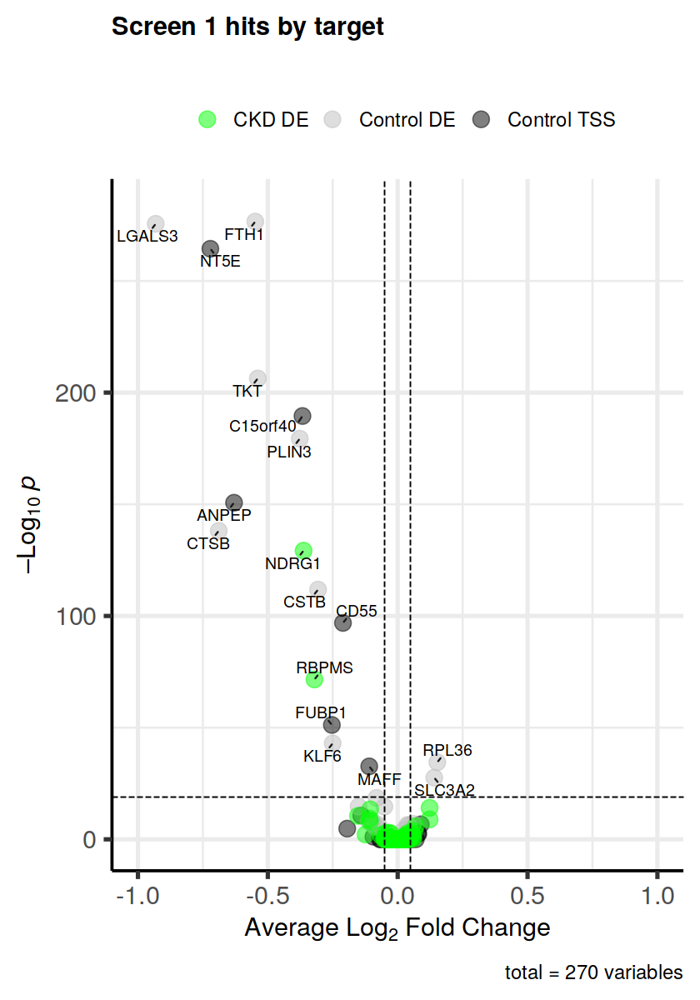

In [66]:
options(repr.plot.width = 7, repr.plot.height = 10)
EnhancedVolcano(df_neighbor_de, 
                lab = df_neighbor_de$de_gene,
                x ="avg_log2FC",
                y ="p_val_adj_mine",
                title = 'Screen 1 hits by target',
                subtitle = '', 
                colCustom = colors,
                drawConnectors = TRUE,
                arrowheads = FALSE,
                pCutoff = 10e-20,
                FCcutoff = 0.05,
                pointSize = 5.0,
                labSize = 4.0
                ) +
                xlim(-1, 1) +
                xlab(expression(paste("Average ", Log[2], " Fold Change"))) +
                ylab(expression(paste("\u2013", Log[10], " ", italic(p))))
                

# lab = df_neighbor_de$de_gene,
# drawConnectors = TRUE,

In [95]:
df_neighbor_de[df_neighbor_de$p_val_adj_mine < 1,]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label,p_val_adj_mine
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,2.8e-154,-0.630,0.461,0.784,1.0e-149,ANPEP,ANPEP,tss,Control TSS,2.0e-151
2,3.0e-14,-0.141,0.775,0.826,1.1e-09,IDH2,ANPEP,tss,Control TSS,2.1e-11
3,2.7e-10,0.089,0.675,0.585,9.7e-06,AP3S2,ANPEP,tss,Control TSS,1.9e-07
4,3.1e-06,0.077,0.826,0.800,1.1e-01,NGRN,ANPEP,tss,Control TSS,2.2e-03
5,4.2e-06,0.080,0.584,0.515,1.5e-01,MFGE8,ANPEP,tss,Control TSS,3.0e-03
6,9.3e-05,-0.093,0.803,0.808,1.0e+00,SEMA4B,ANPEP,tss,Control TSS,6.7e-02
17,1.8e-100,-0.211,0.088,0.367,6.5e-96,CD55,CD55,tss,Control TSS,1.3e-97
25,5.5e-268,-0.721,0.336,0.803,2.0e-263,NT5E,NT5E,tss,Control TSS,4.0e-265
29,8.5e-55,-0.253,0.475,0.675,3.1e-50,FUBP1,FUBP1,tss,Control TSS,6.2e-52


# Run Diffex using LR instead of MAST

In [68]:
targets = unique(filter(df_guide, class=='targeting')$alias)
df_de = NULL
genes_to_skip = c("DE5", "CD55", "CSTB")
genes_to_skip = c()

for(target in targets){
    if(target %in% genes_to_skip){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = "LR",
        latent.vars = c("library", "donor"),
        logfc.threshold = 0.25,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(Red("No DE genes", target,  "\n"))
    }
    markers$de_gene = rownames(markers)
    markers$target = target
    rownames(markers) <- NULL
    df_de = rbind(df_de, markers)
}

ANPEP : CD13-1a,CD13-1b 
Guide+ = 1162 ; Guide- = 25979 
CD55 : CD55-1a,CD55-1b 
Guide+ = 1081 ; Guide- = 26060 
NT5E : CD73-1a,CD73-1b 
Guide+ = 1021 ; Guide- = 26120 
FUBP1 : FUBP1-1a,FUBP1-1b 
Guide+ = 926 ; Guide- = 26215 
C15orf40 : C15orf40-1a,C15orf40-1b 
Guide+ = 1077 ; Guide- = 26064 
MAFF : MAFF-1a,MAFF-1b 
Guide+ = 871 ; Guide- = 26270 
FTH1 : FTH1-1a,FTH1-2a,FTH1-1b,FTH1-2b 
Guide+ = 3503 ; Guide- = 23638 
PLIN3 : PLIN3-1a,PLIN3-2a,PLIN3-1b,PLIN3-2b 
Guide+ = 2060 ; Guide- = 25081 
TKT : TKT-1a,TKT-2a,TKT-1b,TKT-2b 
Guide+ = 1978 ; Guide- = 25163 
LGALS3 : LGALS3-1a,LGALS3-2a,LGALS3-1b,LGALS3-2b 
Guide+ = 2120 ; Guide- = 25021 
CSTB : CSTB-1a,CSTB-2a,CSTB-1b,CSTB-2b 
Guide+ = 2336 ; Guide- = 24805 
CTSB : CTSB-1a,CTSB-2a,CTSB-1b,CTSB-2b 
Guide+ = 2221 ; Guide- = 24920 
KLF6 : KLF6-1a,KLF6-2a,KLF6-1b,KLF6-2b 
Guide+ = 2194 ; Guide- = 24947 
DE1 : DE1-1a,DE1-2a,DE1-1b,DE1-2b 
Guide+ = 2240 ; Guide- = 24901 
DE2 : DE2-1a,DE2-2a,DE2-1b,DE2-2b 
Guide+ = 1233 ; Guide- = 25908 
DE

In [69]:
df_de[df_de$target == "DE15", ]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
743,2.5e-83,0.39,0.90,0.71,9.0e-79,ZIM3,DE15
744,2.0e-76,0.34,0.99,0.98,7.3e-72,PSAP,DE15
745,3.7e-75,-0.32,0.95,0.97,1.4e-70,RBPMS,DE15
746,2.0e-72,0.39,0.99,0.99,7.4e-68,SQSTM1,DE15
747,1.6e-48,0.32,0.94,0.88,5.7e-44,CDKN1A,DE15
748,3.4e-48,0.45,0.28,0.15,1.2e-43,AL357507.1,DE15
749,2.1e-46,-0.25,1.00,1.00,7.8e-42,PTMA,DE15
750,2.2e-41,0.30,0.93,0.88,8.2e-37,MDM2,DE15
751,9.9e-41,-0.39,0.83,0.87,3.6e-36,TUBA1B,DE15


In [70]:
targets = unique(df_de$target)

for(t in targets){
    print(filter(df_de, target == t) %>% head(3))
    cat(yellow("------------------------------------------------------------\n\n\n"))

}

     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 2.8e-154      -0.63  0.46  0.78  1.0e-149   ANPEP  ANPEP
2  7.0e-56       0.47  1.00  0.99   2.6e-51  SQSTM1  ANPEP
3  5.8e-46       0.43  0.90  0.72   2.1e-41    ZIM3  ANPEP
------------------------------------------------------------


    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1.0e-39       0.40  0.90  0.72   3.8e-35    ZIM3   CD55
2 2.9e-39       0.41  1.00  0.99   1.1e-34  SQSTM1   CD55
3 8.3e-30       0.55  0.73  0.65   3.0e-25   HMOX1   CD55
------------------------------------------------------------


     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 5.5e-268      -0.72  0.34  0.80  2.0e-263    NT5E   NT5E
2  1.3e-35       0.41  0.89  0.72   4.8e-31    ZIM3   NT5E
3  2.8e-34       0.42  1.00  0.99   1.0e-29  SQSTM1   NT5E
------------------------------------------------------------


    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 8.5e-55      -0.25  0.47  0.68   3.1e-50   FUBP

# Does the control set have always higher expression regardless of the gene?

[1] "DE6"
Guide+ = 2840 ; Guide- = 24301 
[1] "DE15"
Guide+ = 2322 ; Guide- = 24819 


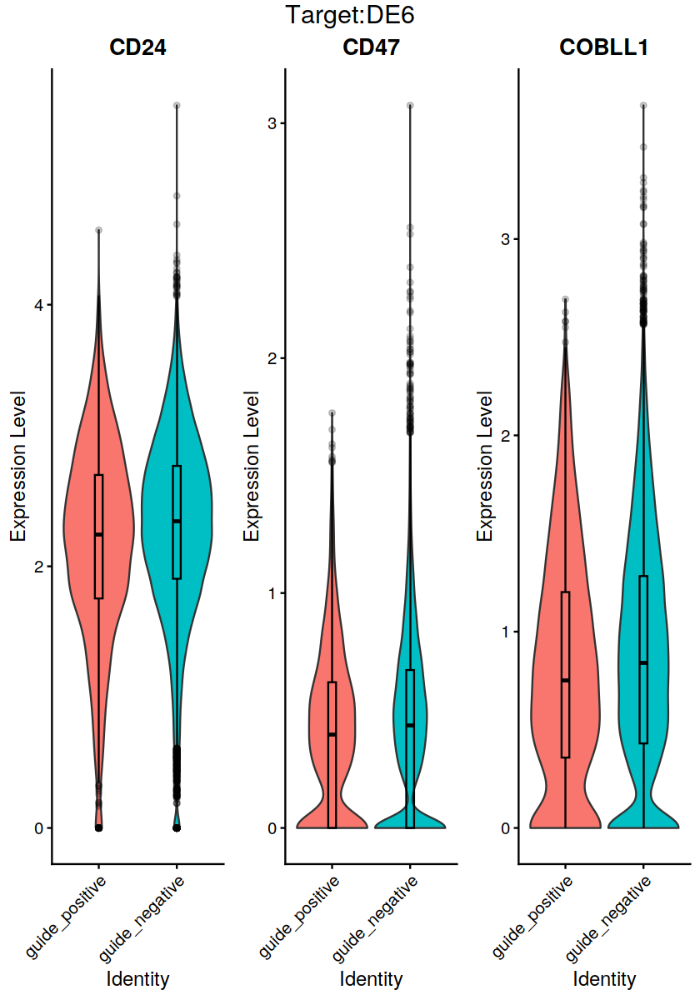

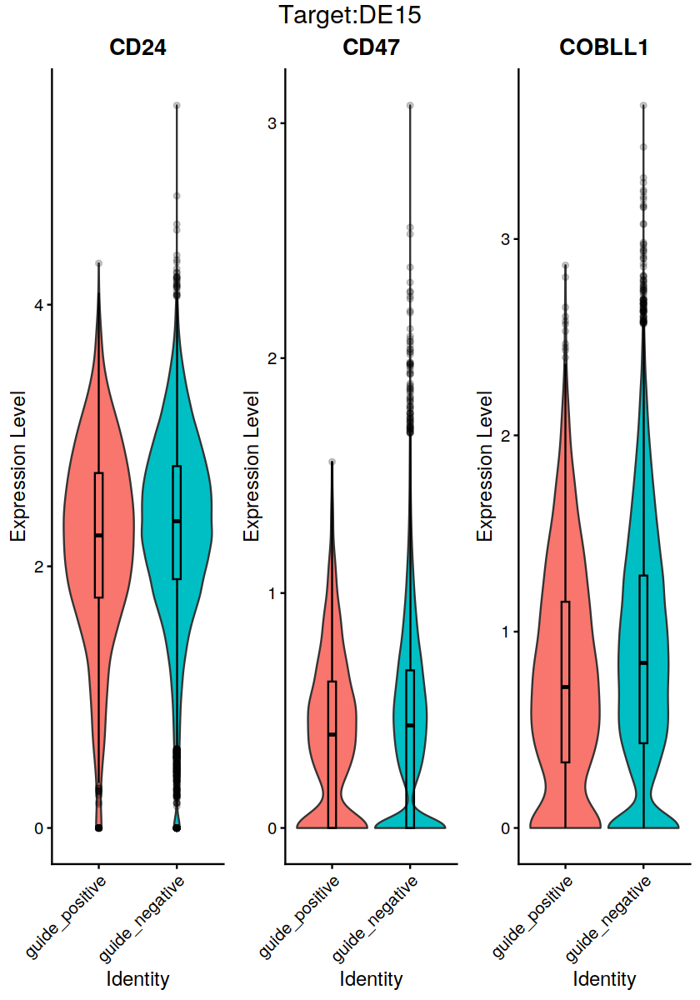

In [71]:
targets = c("DE6", "DE15")
regulated_genes = c("CD24", "CD47", "COBLL1")


for(i in seq_along(targets)) {
    target = targets[i]
    print(target)
    guides = get_guides_by_subclass(df_guide, 'alias', target)
    seurat_rna <- mark_guide_pos_neg(
        seurat_rna, 
        perturbed_cells_by_guide, 
        guides, 
        print_counts = T
    )

    plots <- VlnPlot(
                    object = seurat_rna,
                    features = regulated_genes, 
                    idents = NULL, 
                    pt.size = 0, 
                    sort = F, 
                    ncol = 3,  
                    combine = F  
        ) 

    for(i in 1:length(plots)) {
        plots[[i]] <- plots[[i]] + 
        NoLegend() +
        geom_boxplot(width=0.1, color="black", alpha=0.2)
    }

    title = paste0("Target:", target)
    plt1 <- ggarrange(plotlist=plots, ncol=3, nrow = 1) 
    plt1 <- annotate_figure(plt1, top = text_grob(title, color = "black", size = 18))  

    print(plt1) 
}



# Debug